# Data Generation with Mitsuba

Based on **Benedikt Bitterli's Rendering resources** (https://benedikt-bitterli.me/resources/) and (https://mitsuba.readthedocs.io/en/stable/src/gallery.html=) 32 different 3D scenes have been rendered with Mitsuba 3.

The generated data consists of histograms of radiance per pixel collected over several iterations of monte carlo ray tracing with 1 spp.

In [1]:
!pip install mitsuba==3.6.4 numpy matplotlib scikit-learn

In [2]:
# Data Processing + Utils
import zipfile
import tifffile
import tempfile
import numpy as np
from pathlib import Path

import os
import sys
sys.path.append(os.path.abspath('..')) 

# Mitsuba Renderer
import mitsuba as mi
mi.set_variant("scalar_rgb")
# "cuda_ad_rgb" for GPU or "llvm_ad_rgb" for vectorised and "scalar_rgb" (default) for CPU
from model.SceneRenderer import SceneRenderer

# Image Processing and Visialisation
import matplotlib.pyplot as plt

# PSNR
from skimage.metrics import peak_signal_noise_ratio

In [3]:
print(f"""
Library Version Sanity Check
Mitsuba:     {mi.__version__} (Expected: 3.6.4)
""")


Library Version Sanity Check
Mitsuba:     3.6.4 (Expected: 3.6.4)



## Configuration

In [4]:
LOW_SPP = 32
HIGH_SPP = 4500

# Image resolution 
WIDTH = 512
HEIGHT = 512

LOG_BIN = False
DEBUG = False

# PATHS
input_path = "../data"
output_path = "../output"
SCENE_ROOT = Path(input_path)
OUTPUT_DIR = Path(output_path)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

## Data Loaders

**Data Loaders** from **zip** and **dir**

In [5]:
def extract_scene_zip(zip_path):
    """
    Extracts a zip file to a temporary directory

    Parameters:
    - zip_path (str): path to the zip file

    Returns:
    - temp_dir (str): path to the extracted directory
    """
    temp_dir = tempfile.mkdtemp()
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(temp_dir)
    return temp_dir

In [6]:
def load_scene_xml(scene_dir):
    """
    Loads a scene from .xml file with Mitsuba

    Parameters:
    - scene_dir (str): folder containing files of a scene

    Returns:
    - scene (Mitsuba Scene)
    """
    scene_dir = Path(scene_dir)
    xml_files = [
        f for f in scene_dir.rglob("*.xml")                           # recursive search
        if not f.name.startswith("._") and "__MACOSX" not in str(f)   # filter out metadata files on Mac
    ]

    if not xml_files:
        raise FileNotFoundError(f"No valid XML scene found in {scene_dir}")

    return mi.load_file(str(xml_files[0]))

# Load Data
- Single scene for testing
- Train/test datasets

In [7]:
# SINGLE IMAGE
one_scene = ["data/banner_01"]

# Scene Processing Pipeline

- Noisy Images (LOW_SPP)
- Clean Ground Truth Images (HIGH_SPP)

In [8]:
def plot_images(clean_image, noisy_image, noisy_avg_image):
  """
  NOISY vs. CLEAN Visualisation

  Parameters:
  - clean_image (np array): clean image of shape (H, W, C)
  - noisy_image (np array): noisy image of shape (H, W, C) = average from histograms
  """
  print("Clean Image: ", clean_image.shape)
  print("Average from Renderer: ", noisy_image.shape)
  print("Average from Histogram: ", noisy_avg_image.shape)

  plt.figure(figsize=(12,5))

  # CLEAN IMAGE
  plt.subplot(1,3,1)
  plt.title("Clean Scene")
  plt.imshow(np.clip(clean_image, 0, 1))
  plt.axis('off')

  # AGERAGE FROM RENDERER
  plt.subplot(1,3,2)
  plt.title("Renderer Avg Patch (Low spp)")
  plt.imshow(np.clip(noisy_image, 0, 1))
  plt.axis('off')

  # AGERAGE FROM HISTOGRAM
  plt.subplot(1,3,3)
  plt.title("Histogram Avg Patch (Low spp)")
  plt.imshow(np.clip(noisy_avg_image, 0, 1))
  plt.axis('off')

  plt.tight_layout()
  plt.show()

In [9]:
def save_tiff(data, file_name):
  """
  Saves data of shape (N, H, W, C, B) to TIFF file using BigTIFF if needed.

  Parameters:
  - data (np array): data to save
  - file_name (str): file name / scene name
  """
  tifffile.imwrite(file_name, data, compression='lzw', bigtiff=True)
  print(f"Saved {file_name} with shape {data.shape} <3")

**PSNR** / **Image Quality**
- 20 dB = Poor	
- 20/30 dB = Fair to decent
- 30/40 dB = Good
- \>40 dB	= Excellent

In [10]:
def calculate_psnr_rgb(low_img_tensor, high_img_tensor):
    """Load RGB TIFFs and compute PSNR between low- and high-spp images."""
    # Automatically determine max intensity from high quality reference
    low_img = mi.TensorXf(low_img_tensor).numpy()
    high_img = mi.TensorXf(high_img_tensor).numpy()

    data_range = np.max(high_img)

    psnr = peak_signal_noise_ratio(high_img, low_img, data_range=data_range)
    print(f"PSNR: {psnr} !!!")

In [11]:
def render_scene(scene_path, output_dir=OUTPUT_DIR, low_spp=LOW_SPP, high_spp=HIGH_SPP):
    scene = mi.load_file(str(scene_path))
    sensor = scene.sensors()[0]
    integrator = scene.integrator()

    output_dir.mkdir(parents=True, exist_ok=True)

    # Get parts for filename
    scene_folder_name = scene_path.parent.name
    xml_name = scene_path.stem  # filename without extension
    print(f"Rendering {scene_path.name} .....")

    # 1 SPP MULTI-RENDER
    renderer = SceneRenderer(scene, debug=False)
    low_images = renderer.render_n_images(n=LOW_SPP, spp=1, seed_start=0)
    stack_low = np.stack(low_images, axis=0)
    low_tiff_path = output_dir / f"{scene_folder_name}_{xml_name}_spp1x{LOW_SPP}.tiff"
    save_tiff(stack_low, low_tiff_path)

    # Compute average of the low SPP images for comparison
    img_low_avg = np.mean(stack_low, axis=0)

    # LOW SPP
    img_low = mi.render(scene, sensor=sensor, integrator=integrator, spp=low_spp)
    low_out_path = output_dir / f"{scene_folder_name}_{xml_name}_spp{low_spp}.tiff"
    save_tiff(img_low, low_out_path)

    # HIGH SPP
    img_high = mi.render(scene, sensor=sensor, integrator=integrator, spp=high_spp)
    high_out_path = output_dir / f"{scene_folder_name}_{xml_name}_spp{high_spp}.tiff"
    save_tiff(img_high, high_out_path)
    
    print("Single vs. High")
    calculate_psnr_rgb(img_low, img_high)
    print("Hist vs. High")
    calculate_psnr_rgb(img_low_avg, img_high)
    plot_images(img_high, img_low, img_low_avg)

In [12]:
def process_dataset(root_folder, output_root):
    """
    Process all scene folders inside root_folder.
    Expects scene XML files inside each folder.
    """
    scene_folders = sorted([d for d in root_folder.iterdir() if d.is_dir()])
    print(f"Found {len(scene_folders)} scene folders in {root_folder}")

    for scene_dir in scene_folders:
        # Find all XML files in this scene folder (usually one or more)
        xml_files = sorted(scene_dir.glob("*.xml"))
        if not xml_files:
            print(f"No XML files found in {scene_dir}, skipping.")
            continue

        # Create corresponding output folder (same relative structure)
        relative_path = scene_dir.relative_to(root_folder)
        output_dir = output_root / relative_path
        output_dir.mkdir(parents=True, exist_ok=True)

        for xml_file in xml_files:
            render_scene(xml_file, output_dir)

In [13]:
def render_1ray_scene(xml_file, output_dir, n_images=10, spp=1, base_seed=0, debug=False):
    """
    Renders a scene from an XML file and saves a multi-page TIFF.
    """
    print(f"Rendering scene: {xml_file}")
    
    mi.set_variant('scalar_rgb')
    scene = mi.load_file(str(xml_file))
    
    renderer = SceneRenderer(scene, debug=debug)
    images = renderer.render_n_images(n=n_images, spp=spp, seed_start=base_seed)

    # Construct output filename
    tiff_name = xml_file.stem + "_rendered.tiff"
    output_path = output_dir / tiff_name

    renderer.save_images_to_tiff(images, output_path)

In [14]:
def process_1ray_dataset(root_folder, output_root):
    """
    Process all scene folders inside root_folder.
    Expects scene XML files inside each folder.
    """
    scene_folders = sorted([d for d in root_folder.iterdir() if d.is_dir()])
    print(f"Found {len(scene_folders)} scene folders in {root_folder}")

    for scene_dir in scene_folders:
        xml_files = sorted(scene_dir.glob("*.xml"))
        if not xml_files:
            print(f"No XML files found in {scene_dir}, skipping.")
            continue

        relative_path = scene_dir.relative_to(root_folder)
        output_dir = output_root / relative_path
        output_dir.mkdir(parents=True, exist_ok=True)

        for xml_file in xml_files:
            render_scene(xml_file, output_dir)

# TRAIN & TEST SCENE GENERATION

Found 27 scene folders in ../data
Rendering scene.xml .....


Saved ../output/banner_01/banner_01_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/banner_01/banner_01_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/banner_01/banner_01_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 35.3273890280555 !!!
Hist vs. High
PSNR: 28.972050802617332 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


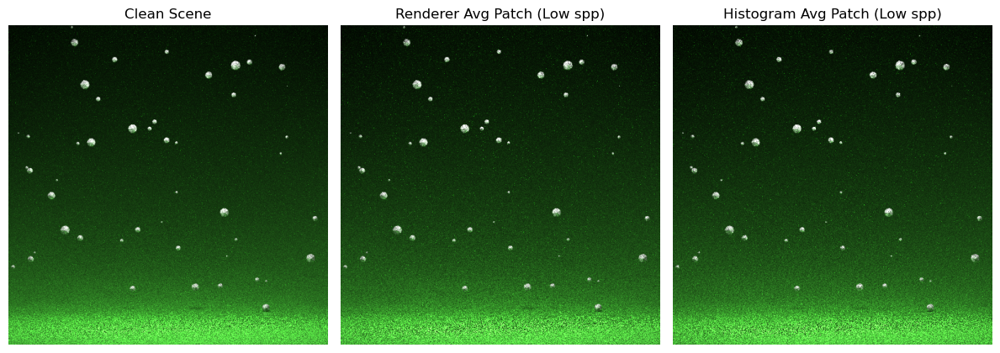

Rendering scene.xml .....
Saved ../output/banner_02/banner_02_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/banner_02/banner_02_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/banner_02/banner_02_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 44.00345461693977 !!!
Hist vs. High
PSNR: 37.55812195583153 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


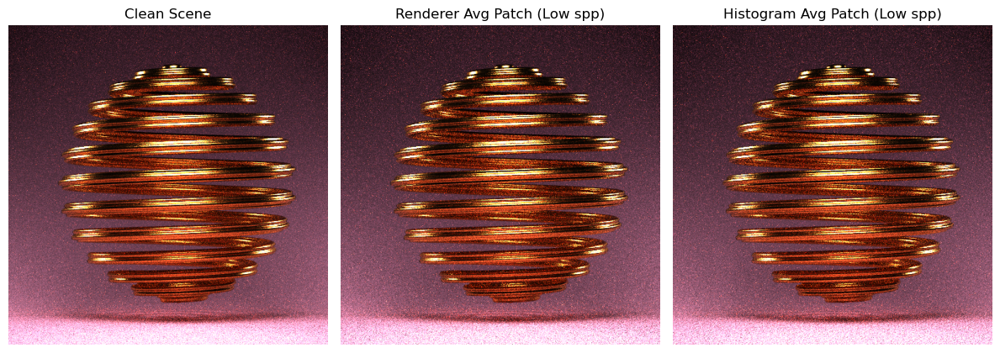

Rendering scene.xml .....
Saved ../output/banner_04/banner_04_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/banner_04/banner_04_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/banner_04/banner_04_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 30.215740037617266 !!!
Hist vs. High
PSNR: 23.821135038523543 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


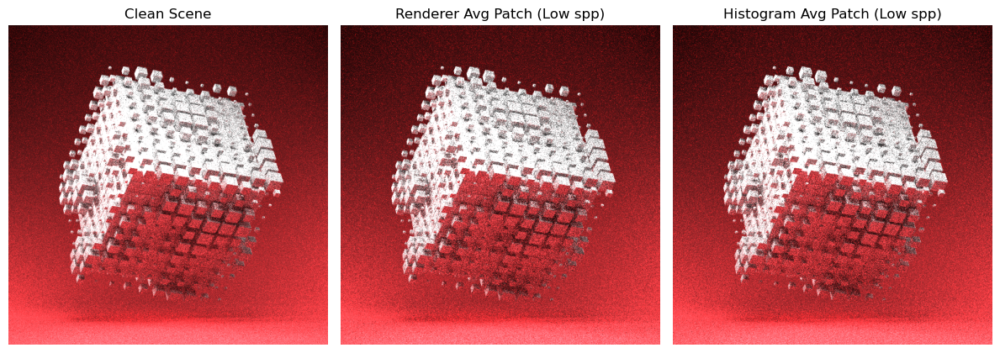

Rendering scene.xml .....
Saved ../output/banner_05/banner_05_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/banner_05/banner_05_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/banner_05/banner_05_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 33.00226268836521 !!!
Hist vs. High
PSNR: 26.535635597433682 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


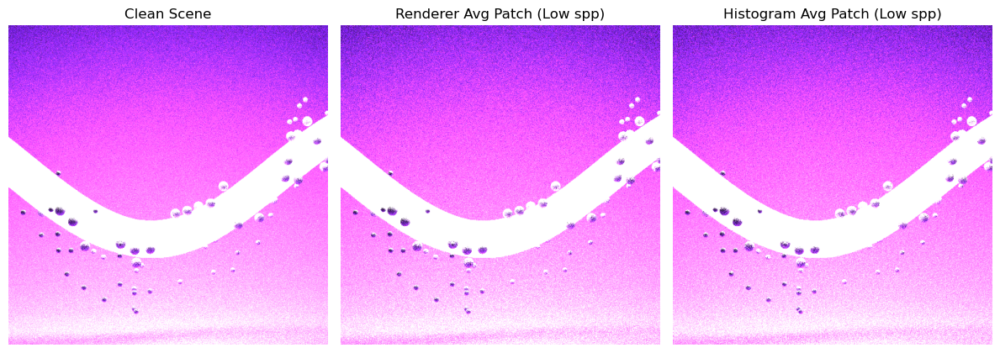

Rendering scene.xml .....
Saved ../output/banner_07/banner_07_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/banner_07/banner_07_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/banner_07/banner_07_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 46.28651929513799 !!!
Hist vs. High
PSNR: 37.55679763722216 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


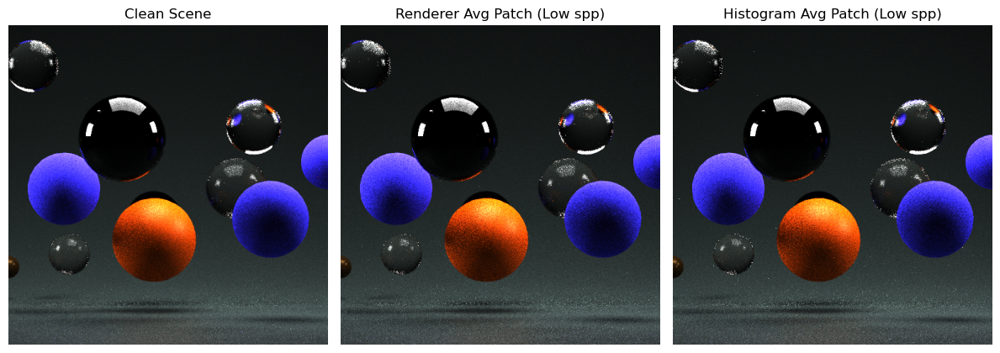

Rendering scene.xml .....
Saved ../output/bathroom/bathroom_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/bathroom/bathroom_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/bathroom/bathroom_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 36.57931374330947 !!!
Hist vs. High
PSNR: 30.138515490785185 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


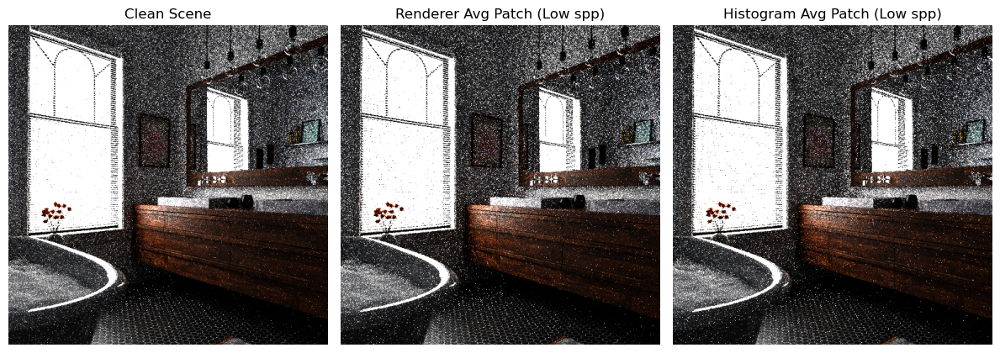

Rendering scene.xml .....
Saved ../output/bathroom2/bathroom2_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/bathroom2/bathroom2_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/bathroom2/bathroom2_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 52.56789676774717 !!!
Hist vs. High
PSNR: 45.990882245121384 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


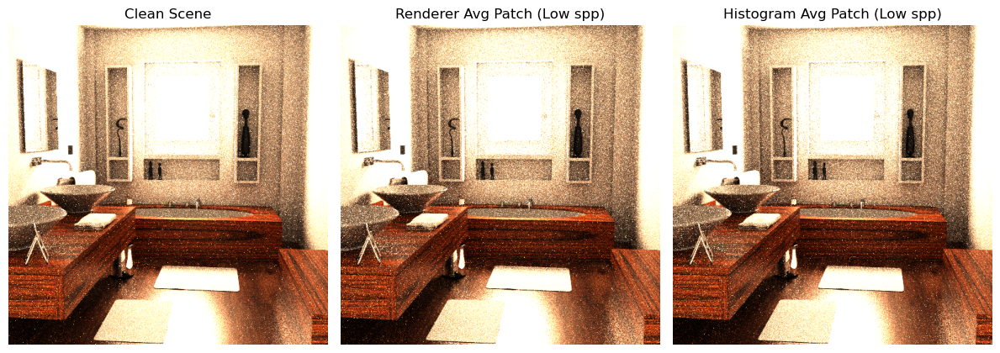

Rendering scene.xml .....
Saved ../output/bedroom/bedroom_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/bedroom/bedroom_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/bedroom/bedroom_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 35.29154755374311 !!!
Hist vs. High
PSNR: 28.79810046243065 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


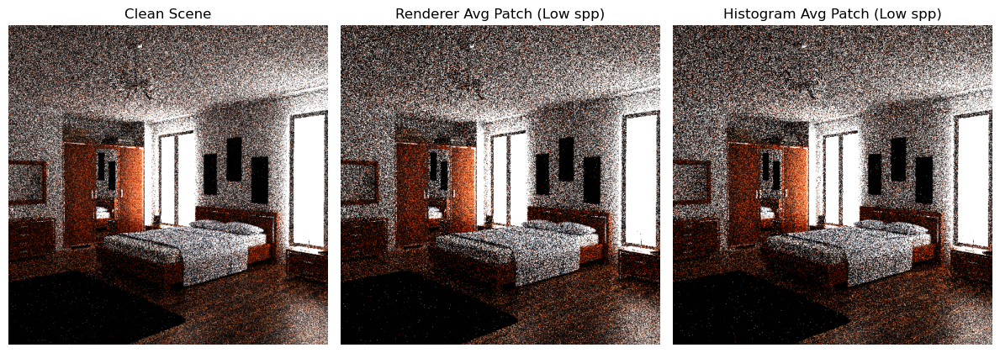

Rendering scene.xml .....
Saved ../output/classroom/classroom_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/classroom/classroom_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/classroom/classroom_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 45.409810201876084 !!!
Hist vs. High
PSNR: 39.15339050183356 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


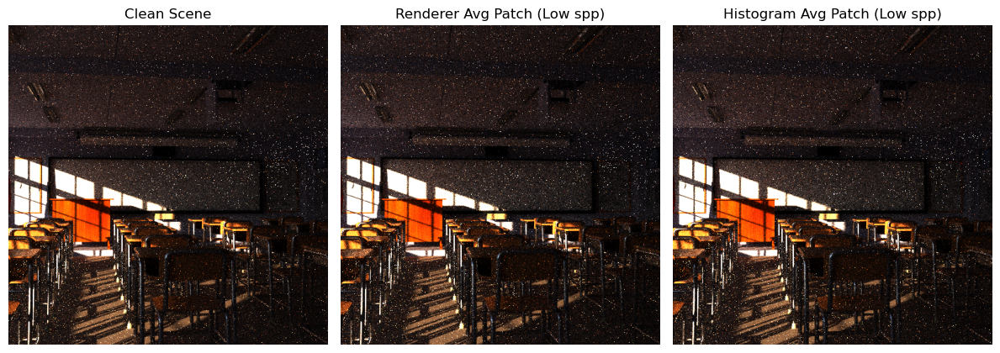

Rendering scene.xml .....
Saved ../output/cornell-box/cornell-box_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/cornell-box/cornell-box_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/cornell-box/cornell-box_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 62.28179612444138 !!!
Hist vs. High
PSNR: 55.95463695487257 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


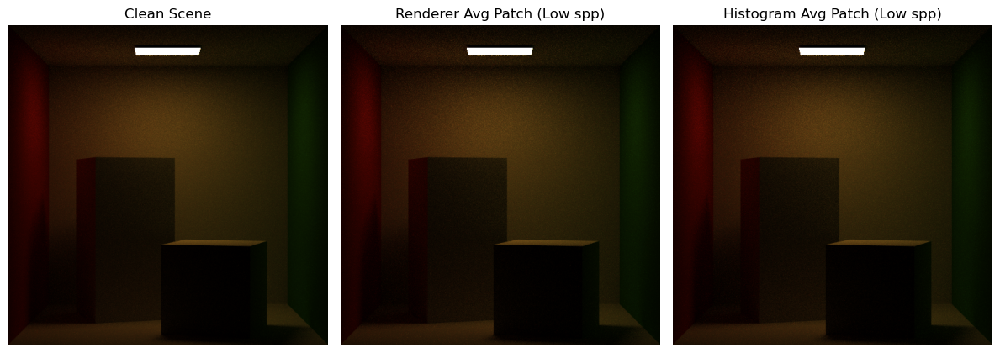

Rendering scene.xml .....
Saved ../output/dining-room/dining-room_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/dining-room/dining-room_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/dining-room/dining-room_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 56.44362287747681 !!!
Hist vs. High
PSNR: 51.263676542356706 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


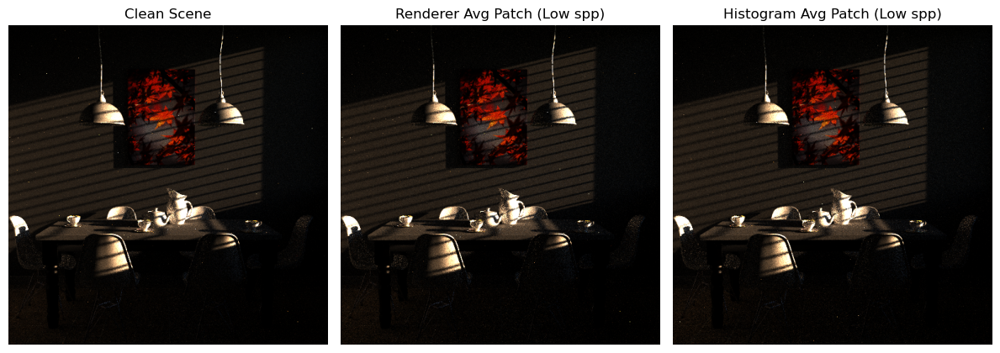

Rendering scene.xml .....
Saved ../output/glass-of-water/glass-of-water_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/glass-of-water/glass-of-water_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/glass-of-water/glass-of-water_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 46.0511539236385 !!!
Hist vs. High
PSNR: 38.60643519451001 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


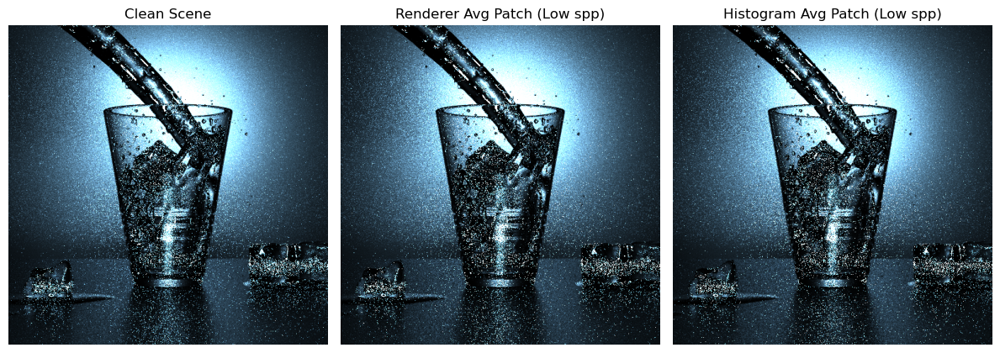

Rendering scene-above.xml .....
Saved ../output/house/house_scene-above_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/house/house_scene-above_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/house/house_scene-above_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 41.06612000237176 !!!
Hist vs. High
PSNR: 34.55861113450901 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


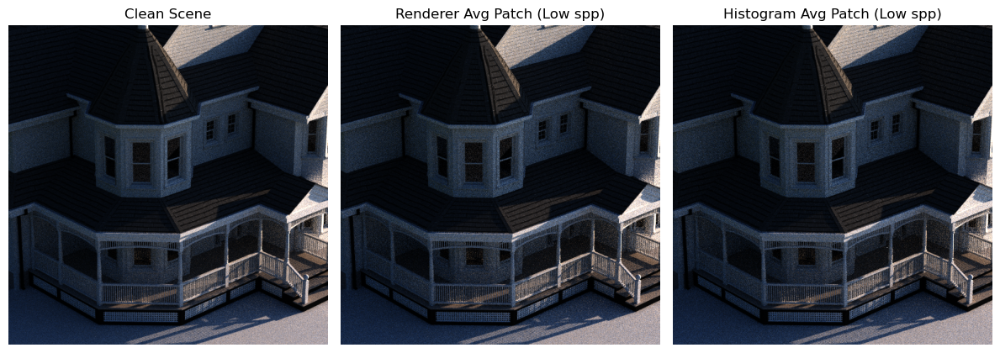

Rendering scene.xml .....
Saved ../output/house/house_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/house/house_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/house/house_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 44.060121510964436 !!!
Hist vs. High
PSNR: 37.58898503808304 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


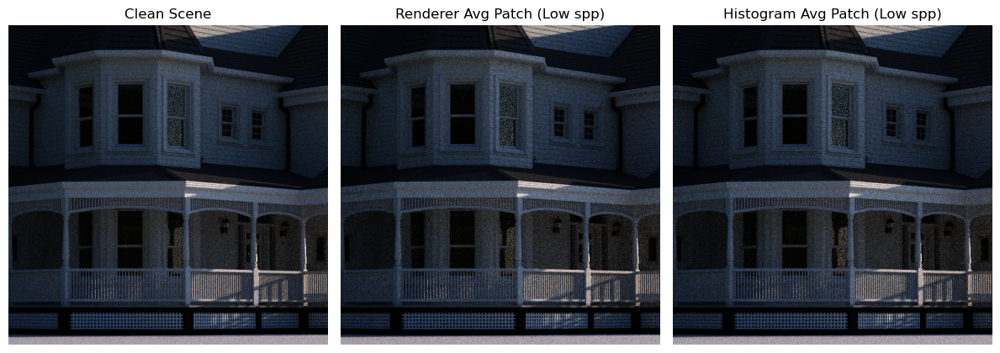

Rendering scene.xml .....
Saved ../output/kitchen/kitchen_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/kitchen/kitchen_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/kitchen/kitchen_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 41.27888273456711 !!!
Hist vs. High
PSNR: 34.91209367712259 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


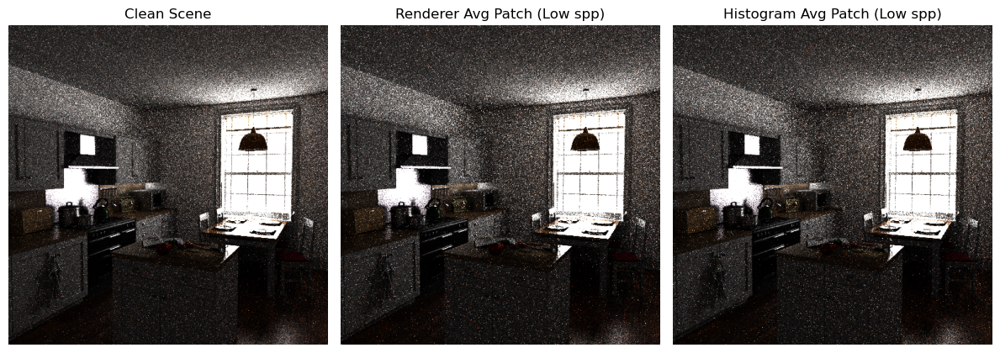

Rendering scene-above.xml .....
Saved ../output/lamp/lamp_scene-above_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/lamp/lamp_scene-above_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/lamp/lamp_scene-above_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 38.652944234749185 !!!
Hist vs. High
PSNR: 32.15988057126118 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


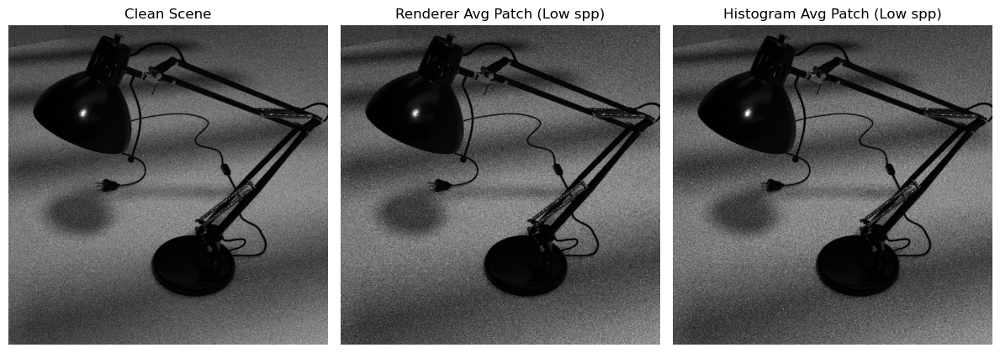

Rendering scene.xml .....
Saved ../output/lamp/lamp_scene_spp1x32.tiff with shape (32, 512, 512, 3) <3
Saved ../output/lamp/lamp_scene_spp32.tiff with shape (512, 512, 3) <3
Saved ../output/lamp/lamp_scene_spp50.tiff with shape (512, 512, 3) <3
Single vs. High
PSNR: 37.59936160479362 !!!
Hist vs. High
PSNR: 31.134427513913362 !!!
Clean Image:  (512, 512, 3)
Average from Renderer:  (512, 512, 3)
Average from Histogram:  (512, 512, 3)


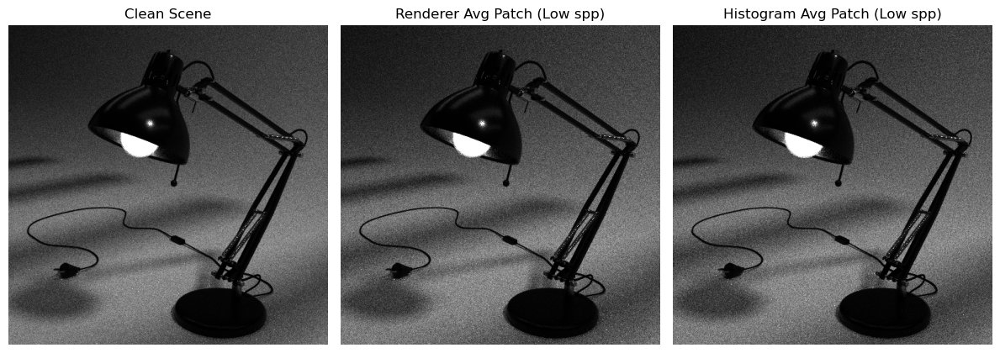

Rendering scene.xml .....


In [15]:
# Run for train and test
# process_dataset(SCENE_ROOT, OUTPUT_DIR)

process_1ray_dataset(SCENE_ROOT, OUTPUT_DIR)